In [95]:
from ctapipe.io import event_source
from scipy.linalg import svd
from ctapipe.utils import get_dataset
from copy import deepcopy
import numpy as np
import matplotlib.pyplot as plt
from ctapipe.visualization import CameraDisplay
import hipecta
from ctapipe.image import convert_geometry_hex1d_to_rect2d
from ctapipe.image import convert_geometry_rect2d_back_to_hexe1d
from ctapipe.calib import CameraCalibrator
import copy
from ctapipe.image import tailcuts_clean
import astropy.units as u

In [2]:
def find_max_event(events):
    event_id_max = 0
    tel_id_max = 0
    amp_max = 0
    for event_id, event in enumerate(events):
        for tel_id in event.r0.tels_with_data:
            if event.r0.tel[tel_id].image.sum() > amp_max:
                amp_max = event.r0.tel[tel_id].image.sum()
                tel_id_max = tel_id
                event_id_max = event_id
    return event_id_max, tel_id_max

In [3]:
def samples_calibration(event, tel_id):
    data = event.r0.tel[tel_id].waveform[0]
    ped = event.mc.tel[tel_id].pedestal[0]
    nsamples = data.shape[1]
    dc2pe = event.mc.tel[tel_id].dc_to_pe[0]
    calibrated_samples = (data - ped[...,None]/nsamples)*dc2pe[...,None]
    return calibrated_samples

In [4]:
# filename = get_dataset('gamma_test.simtel.gz')
filename = '/Users/thomasvuillaume/Work/CTA/Data/Simtel/gamma_20deg_0deg_run100___cta-prod3-lapalma3-2147m-LaPalma.simtel.gz'

In [5]:
source = event_source(filename)

In [6]:
source.max_events = 10

In [7]:
events = [deepcopy(event) for event in source]

In [8]:
event_id, tel_id = find_max_event(events)
event = events[event_id]

In [9]:
cal = CameraCalibrator(None, None, r1_product='HESSIOR1Calibrator', extractor_product='LocalPeakIntegrator')
cal.calibrate(event)

In [10]:
camera = event.inst.subarray.tel[tel_id].camera
image = event.r0.tel[tel_id].image[0]

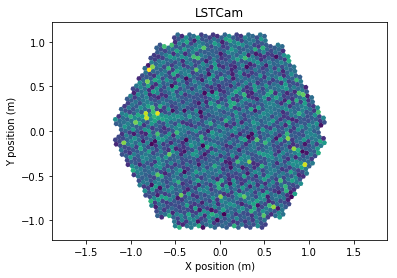

In [11]:
CameraDisplay(camera, image)

In [17]:
calibrated_samples = samples_calibration(event, tel_id)

In [70]:
calibrated_image = event.dl1.tel[tel_id].image[0]

## PCA/SVD

In [30]:
square_geom, square = convert_geometry_hex1d_to_rect2d(camera, image)

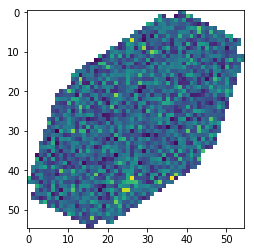

In [31]:
plt.imshow(square)

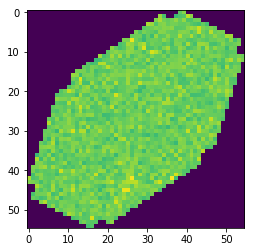

In [32]:
plt.imshow(np.nan_to_num(square))

In [33]:
SVD = svd(np.nan_to_num(square))

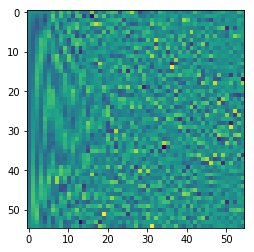

In [34]:
plt.imshow(SVD[0])

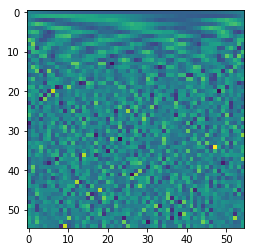

In [35]:
plt.imshow(SVD[2])

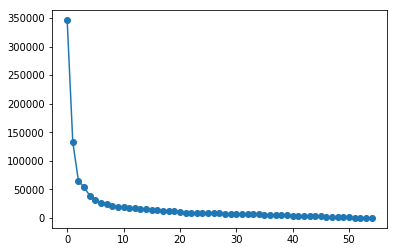

In [39]:
plt.plot(SVD[1], '-o')

In [40]:
# create m x n Sigma matrix
Sigma = np.zeros((square.shape[0], square.shape[1]))
# populate Sigma with n x n diagonal matrix
Sigma[:square.shape[1], :square.shape[1]] = np.diag(SVD[1])
# reconstruct matrix
B = SVD[0].dot(Sigma.dot(SVD[2]))

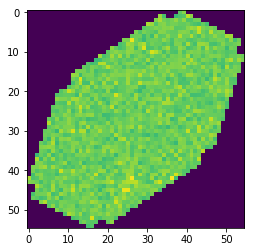

In [41]:
plt.imshow(B)

In [42]:
# create m x n Sigma matrix
reduced_svd = deepcopy(SVD[1])
reduced_svd[4:] = 0
Sigma = np.diag(reduced_svd)
# reconstruct matrix
C = SVD[0].dot(Sigma.dot(SVD[2]))

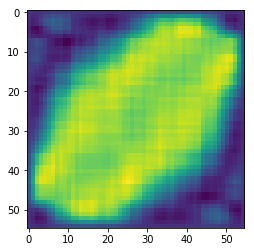

In [43]:
plt.imshow(C)

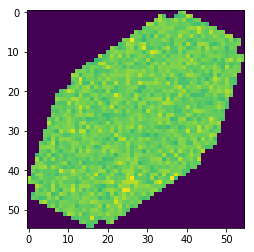

In [44]:
from sklearn.decomposition import TruncatedSVD

# svd
svd = TruncatedSVD(n_components=54)
svd.fit(np.nan_to_num(square))
svd.singular_values_[20:] = 0
result = svd.transform(np.nan_to_num(square))
Sigma = np.zeros_like(square)
Sigma[:result.shape[0],:result.shape[1]] = result
B = SVD[0].dot(Sigma.dot(SVD[2]))
plt.imshow(svd.inverse_transform(result))

In [49]:
import sklearn

In [50]:
pca = sklearn.decomposition.PCA()

X = np.nan_to_num(square)
pca.fit(X)

nComp = 2
Xhat = np.dot(pca.transform(X)[:,:nComp], pca.components_[:nComp,:])
# Xhat += mu

# print(Xhat[0,])
pca.components_.shape

(55, 55)

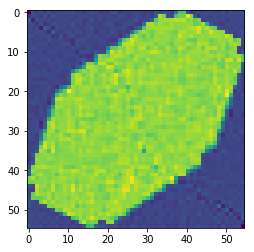

In [51]:
pca = sklearn.decomposition.PCA(n_components=20)
pca.fit(X)
components = pca.transform(X)
filtered = pca.inverse_transform(components)
plt.imshow(filtered)

In [21]:
import sklearn.decomposition

In [57]:
calibrated_samples.T[0].shape

(1855,)

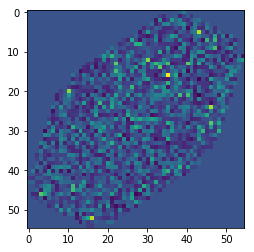

In [111]:
pca = sklearn.decomposition.PCA(n_components=55)
square_geom, square  = convert_geometry_hex1d_to_rect2d(camera, calibrated_samples.T[0])
X = np.nan_to_num(square)
pca.fit(X)
components = pca.transform(X)
filtered = pca.inverse_transform(components)
plt.imshow(filtered)

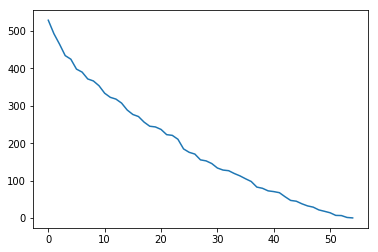

In [59]:
plt.plot(pca.singular_values_)

In [60]:
def pca_time(camera, calibrated_waveforms):
    pca_array = []
    pca = sklearn.decomposition.PCA(n_components=55)
    for image in calibrated_waveforms:
        square_geom, square  = convert_geometry_hex1d_to_rect2d(camera, image)
        X = np.nan_to_num(square)
        pca.fit(X)
        # components = pca.transform(X)
        pca_array.append(pca.singular_values_)
    return np.array(pca_array)

In [61]:
time_components = pca_time(camera, calibrated_samples.T)

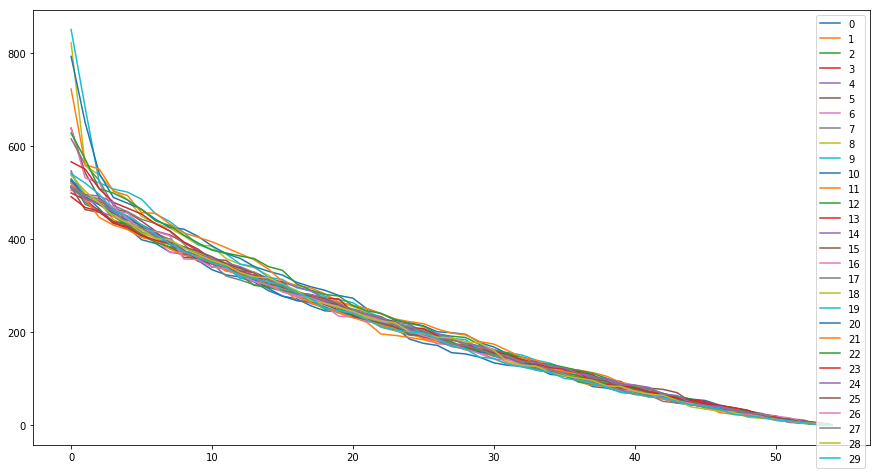

In [62]:
plt.figure(figsize=(15,8))
for i, tc in enumerate(time_components):
    plt.plot(tc, label=(str(i)))
plt.legend()

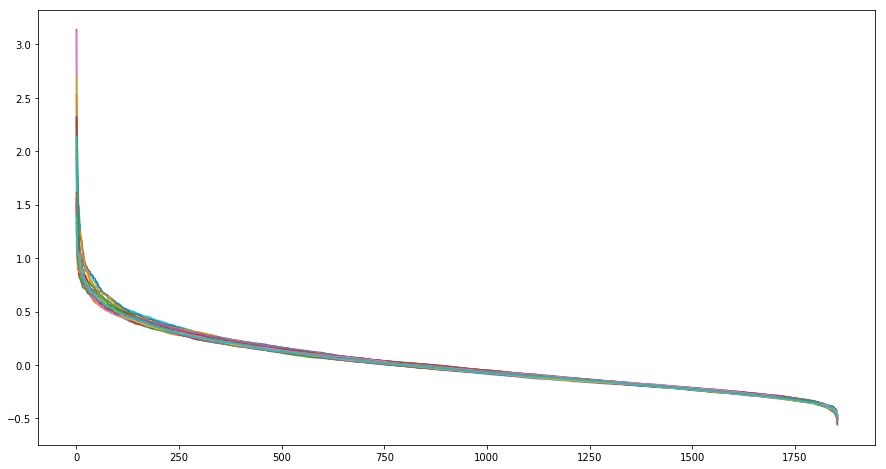

In [106]:
plt.figure(figsize=(15,8))
for image in calibrated_samples.T:
    plt.plot(np.sort(image)[::-1])

# Tests using timing info

In [18]:
def plot_pixel_time_series(calibrated_samples, pixel_id, ax=None, **kwargs):
    ax = plt.gca() if ax is None else ax
    ax.plot(calibrated_samples[pixel_id], **kwargs)
    return ax

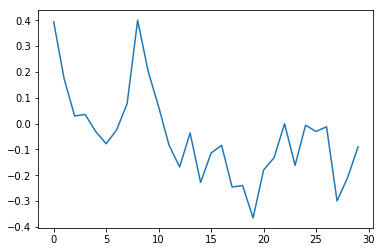

In [19]:
plot_pixel_time_series(calibrated_samples, 0)

In [20]:
def plot_samples_sum_time(calibrated_samples, ax=None, **kwargs):
    ax = plt.gca() if ax is None else ax
    ax.plot(calibrated_samples.sum(axis=0), **kwargs)
    return ax

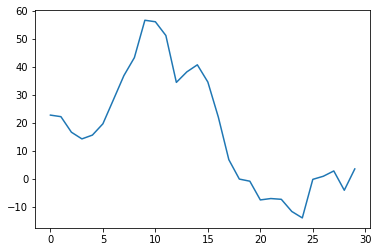

In [21]:
plot_samples_sum_time(calibrated_samples)

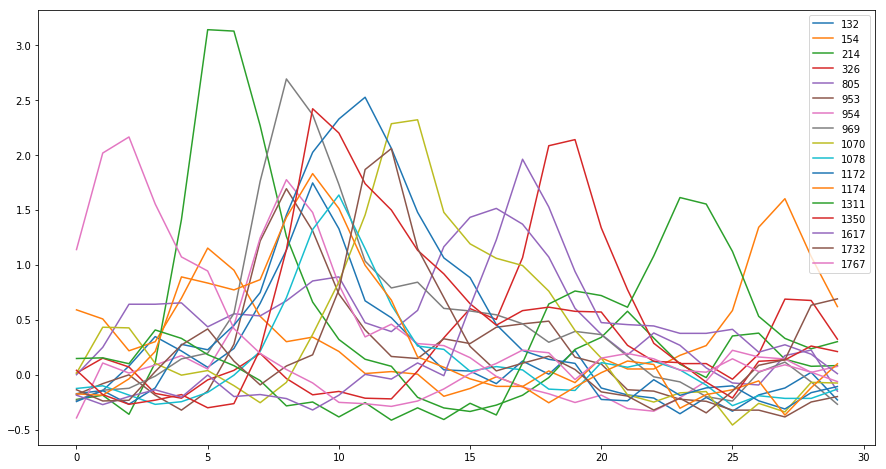

In [22]:
plt.figure(figsize=(15,8))
for i, pixel in enumerate(calibrated_samples):
    if pixel.max()>1.5:
        plot_pixel_time_series(calibrated_samples, i, label=str(i))
plt.legend()

250


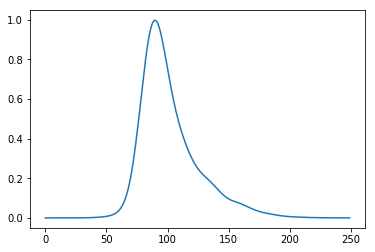

In [23]:
pulse_shape = event.mc.tel[tel_id].reference_pulse_shape[0]
print(len(pulse_shape))
plt.plot(pulse_shape);

In [24]:
def plot_curve_centered(points, nsamples=None):
    nsamples = len(points) if nsamples is None else nsamples
    

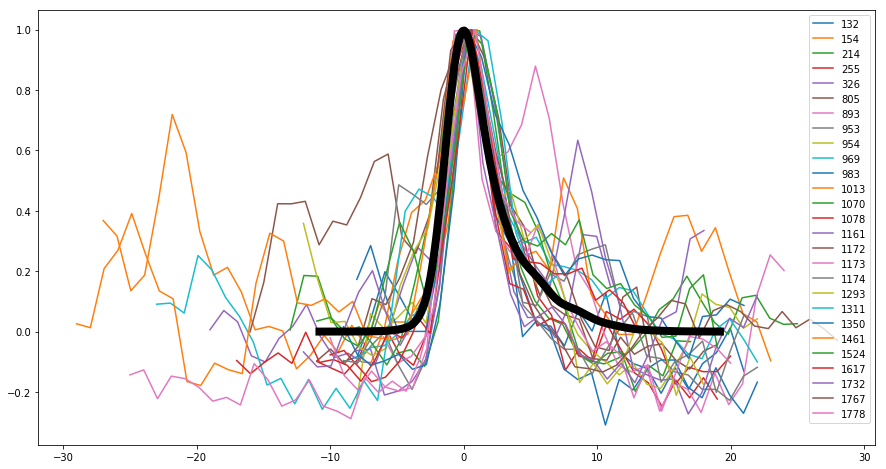

In [25]:
plt.figure(figsize=(15,8))
nsamples = calibrated_samples.shape[1]
mask = np.zeros_like(image, dtype=bool)

for i, pixel in enumerate(calibrated_samples):
    if pixel.max()>1.4:
        plt.plot(np.linspace(0-pixel.argmax(),nsamples-pixel.argmax(), nsamples), pixel/pixel.max(), label=str(i))
        mask[i] = True
max_ps = pulse_shape.argmax() * nsamples / len(pulse_shape)
plt.plot(np.linspace(-max_ps, nsamples-max_ps, len(pulse_shape)), pulse_shape, linewidth=8, color='black')
plt.legend()

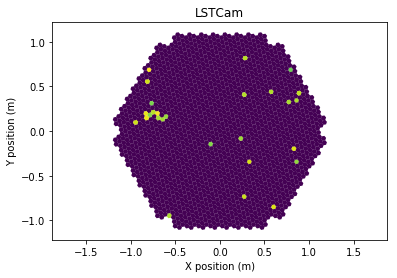

In [155]:
clean = copy.copy(event.r0.tel[tel_id].image[0])
clean[~mask] = 0
CameraDisplay(camera, clean)

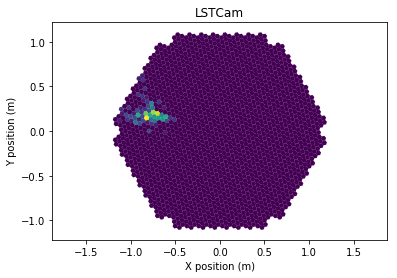

In [156]:
CameraDisplay(camera, event.mc.tel[tel_id].photo_electron_image)

In [27]:
def true_pixels_with_signal(event):
    true_pe = event.mc.tel[tel_id].photo_electron_image
    mask = np.zeros_like(true_pe, dtype=bool)
    mask[true_pe>0] = True
    return mask

In [28]:
signal_mask = true_pixels_with_signal(event)

In [45]:
pixpos = np.transpose([camera.pix_x.value, camera.pix_y.value])

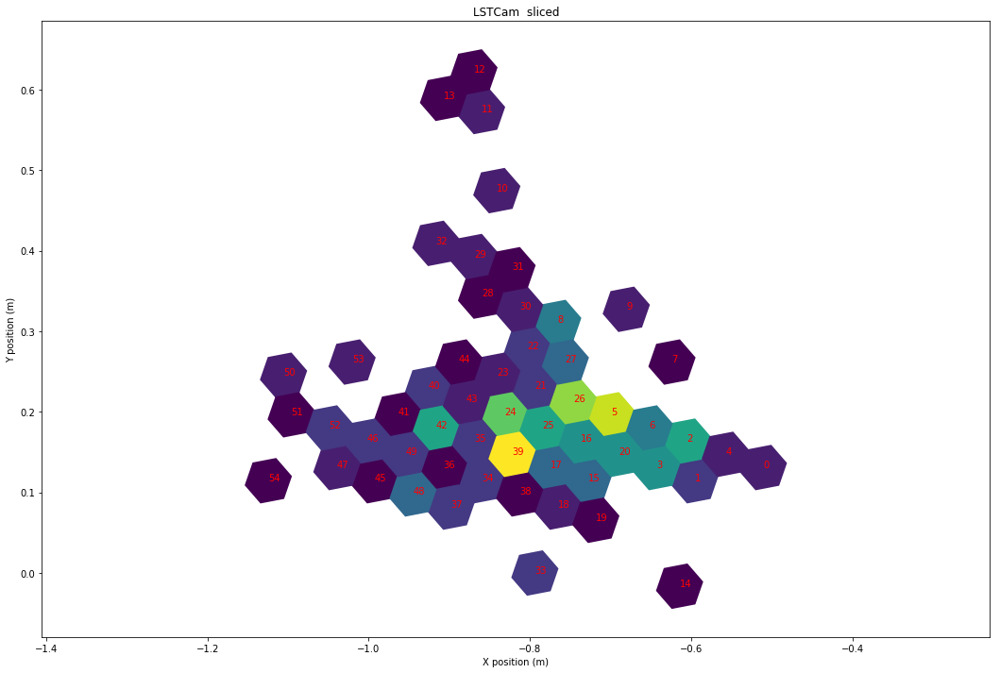

In [57]:
plt.figure(figsize=(18,12))
CameraDisplay(camera[signal_mask], event.mc.tel[tel_id].photo_electron_image[signal_mask])
pixids = np.array([str(i) for i in range(len(signal_mask[signal_mask]))])
for x, y, pid in zip(pixpos[:,0][signal_mask], pixpos[:,1][signal_mask], pixids):
    plt.text(x, y, pid, color='red')

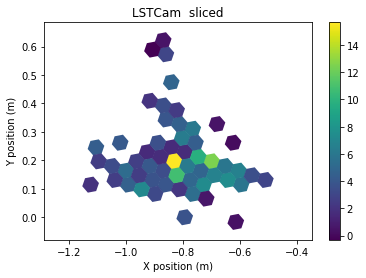

In [71]:
im = CameraDisplay(camera[signal_mask], calibrated_image[signal_mask])
im.add_colorbar()

Text(0.5,1,'PEAK TIME')

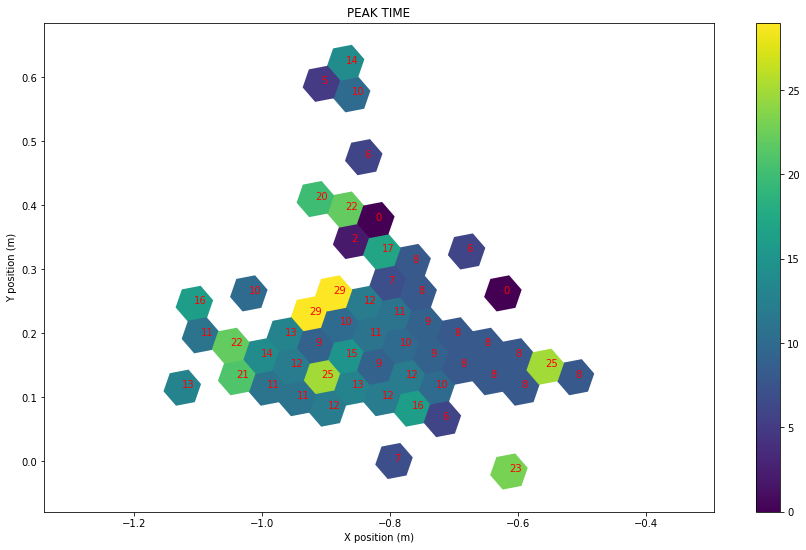

In [68]:
plt.figure(figsize=(15,9))
im = CameraDisplay(camera[signal_mask], event.dl1.tel[tel_id].peakpos[0][signal_mask])
for x, y, pp in zip(pixpos[:,0][signal_mask], pixpos[:,1][signal_mask], event.dl1.tel[tel_id].peakpos[0][signal_mask]):
    plt.text(x, y, str(pp), color='red')
im.add_colorbar()
plt.title("PEAK TIME")

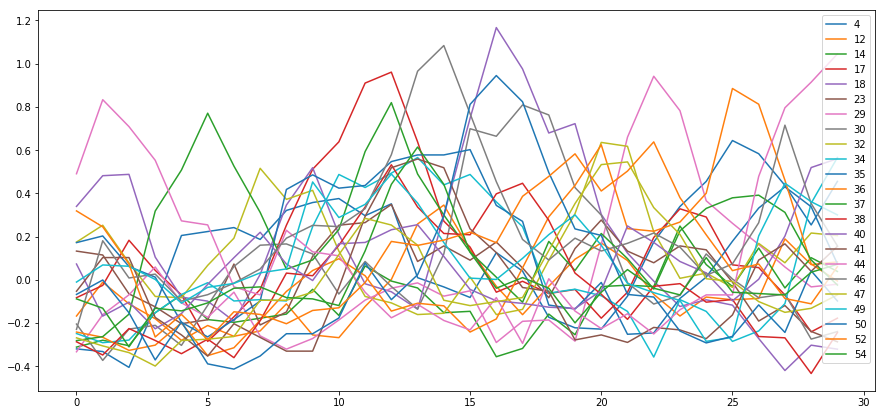

In [60]:
plt.figure(figsize=(15,7))
for i, pixel in enumerate(calibrated_samples[signal_mask]):
    # if pixel.sum() < 5:
    if pixel.argmax()>11:
        plt.plot(pixel, label=str(i))
plt.legend()

In [168]:
len(pulse_shape[::int(len(pulse_shape)/nsamples)])

32

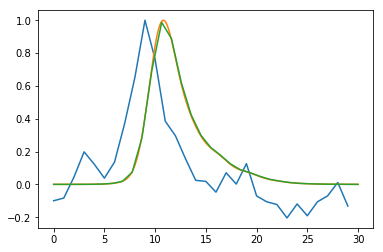

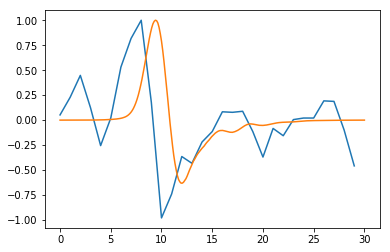

In [169]:
plt.plot(calibrated_samples[132]/calibrated_samples[132].max())
plt.plot(np.linspace(0, 30, len(pulse_shape)), pulse_shape/pulse_shape.max())
plt.plot(np.linspace(0,30,32), pulse_shape[::int(len(pulse_shape)/nsamples)])
plt.show()
plt.plot(np.gradient(calibrated_samples[132])/np.gradient(calibrated_samples[132]).max())
plt.plot(np.linspace(0, 30, len(pulse_shape)), np.gradient(pulse_shape)/np.gradient(pulse_shape).max())

In [162]:
from scipy.stats import pearsonr

In [170]:
pearsonr(pulse_shape, calibrated_samples[132])

ValueError: operands could not be broadcast together with shapes (250,) (30,) 

In [185]:
def center_pulse(array):
    x = np.arange(len(array)) - array.argmax()
    return x, array

In [180]:
def resample_center_pulse(array, nsamples):
    # assume the samples are linearly spaced of 1ns
    x = np.linspace(0, nsamples, nsamples)
    y = np.interp(x, np.linspace(0, nsamples, len(array)), array)
    x = np.linspace(-y.argmax(), nsamples-y.argmax(), nsamples)
    return x, y

In [217]:
len(xp), len(centered_pulse)

(250, 30)

(0.7748142854319254, 5.00973182779248e-07)


-0.013427160793604946

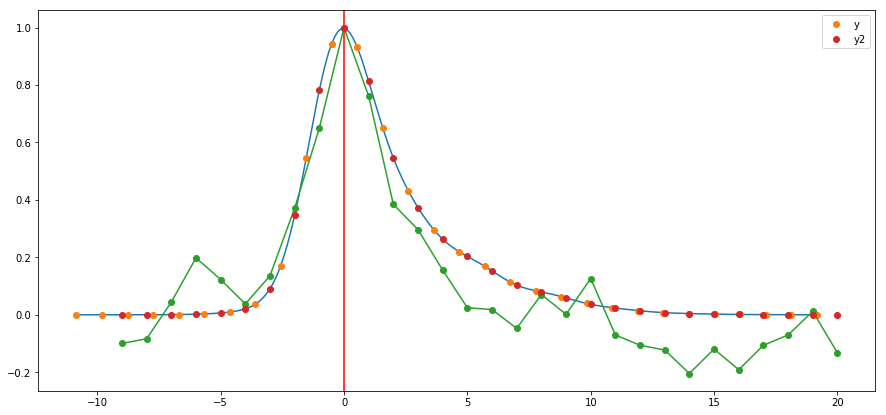

In [281]:
plt.figure(figsize=(15,7))
plt.axvline(x=0., color='red')
xp, centered_pulse = center_pulse(pulse_shape)
xp = xp *30/(xp.max()-xp.min())
plt.plot(xp, centered_pulse, '-')
x = np.linspace(xp.min(), xp.max(), 30)
y = np.interp(x, xp, centered_pulse)
plt.plot(x, y, 'o', label='y')
x, centered_calibrated = center_pulse(calibrated_samples[132])
plt.plot(x, centered_calibrated/centered_calibrated.max(), '-o')
y2 = np.interp(x, xp, centered_pulse)
plt.plot(x, y2, 'o', label='y2')
plt.legend()
print(pearsonr(y, y2))
(y2 - centered_calibrated).mean()

In [283]:
def find_pixel_with_good_shape(calibrated_samples, pulse_shape):
    xp, centered_pulse = center_pulse(pulse_shape)
    pixel_mask = np.zeros_like(calibrated_samples.T[0], dtype=bool)
    for i, pixel in enumerate(calibrated_samples):
        x, centered_pixel = center_pulse(pixel)
        y2 = np.interp(x, xp, centered_pulse)
        if np.abs((y2 - pixel)).mean() < 0.4:
            pixel_mask[i] = True          
#         if pearsonr(centered_pixel, y2)[0] > 0.7:
#             pixel_mask[i] = True
    return pixel_mask

In [284]:
pixel_mask = find_pixel_with_good_shape(calibrated_samples, pulse_shape)

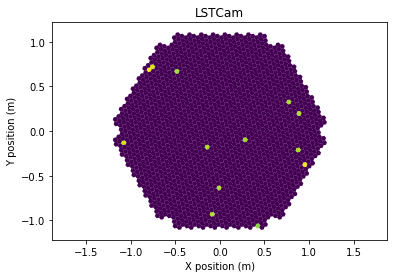

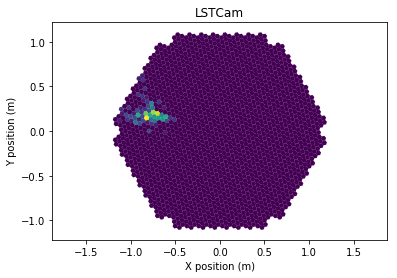

In [285]:
clean = copy.deepcopy(event.r0.tel[tel_id].image[0])
clean[~pixel_mask] = 0
CameraDisplay(camera, clean)
plt.show()
CameraDisplay(camera, event.mc.tel[tel_id].photo_electron_image)

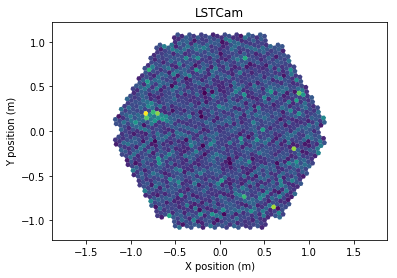

In [301]:
CameraDisplay(camera, calibrated_image)

In [117]:
cleanmask = tailcuts_clean(camera, calibrated_image,
                                           picture_thresh=6,
                                           boundary_thresh=3,
                                           keep_isolated_pixels=False,
                                           min_number_picture_neighbors=1,
                                           )
cleaned = copy.copy(event.dl1.tel[tel_id].image[0])
cleaned[~cleanmask] = 0

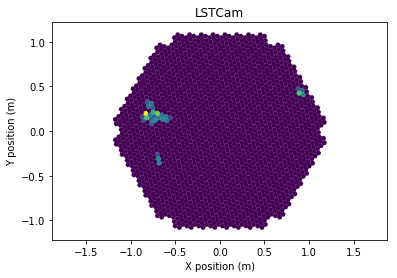

In [118]:
CameraDisplay(camera, cleaned)

In [323]:
peakpos = event.dl1.tel[tel_id].peakpos[0]

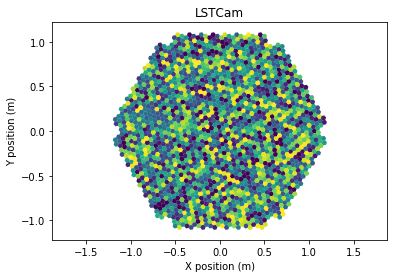

In [324]:
CameraDisplay(camera, peakpos)

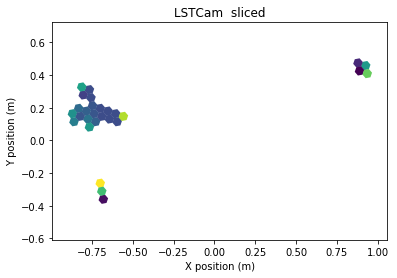

In [325]:
CameraDisplay(camera[cleanmask], peakpos[cleanmask])

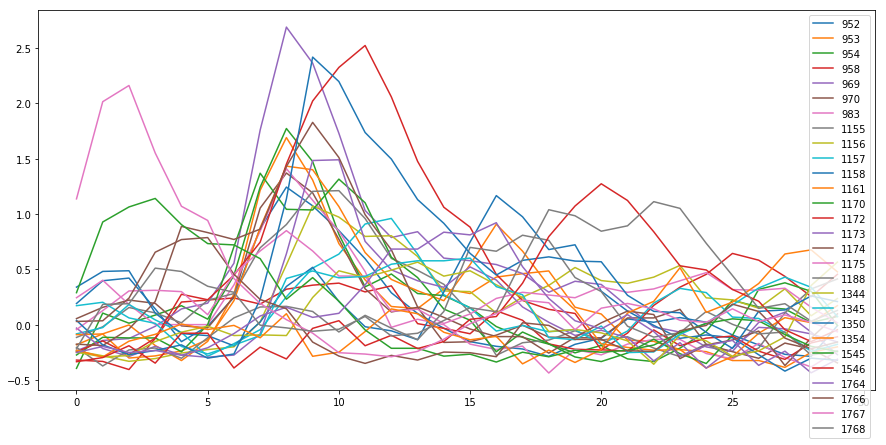

In [312]:
plt.figure(figsize=(15,7))
for i, p in enumerate(cleanmask):
    if p:
        plot_pixel_time_series(calibrated_samples, i, label=str(i))
plt.legend()

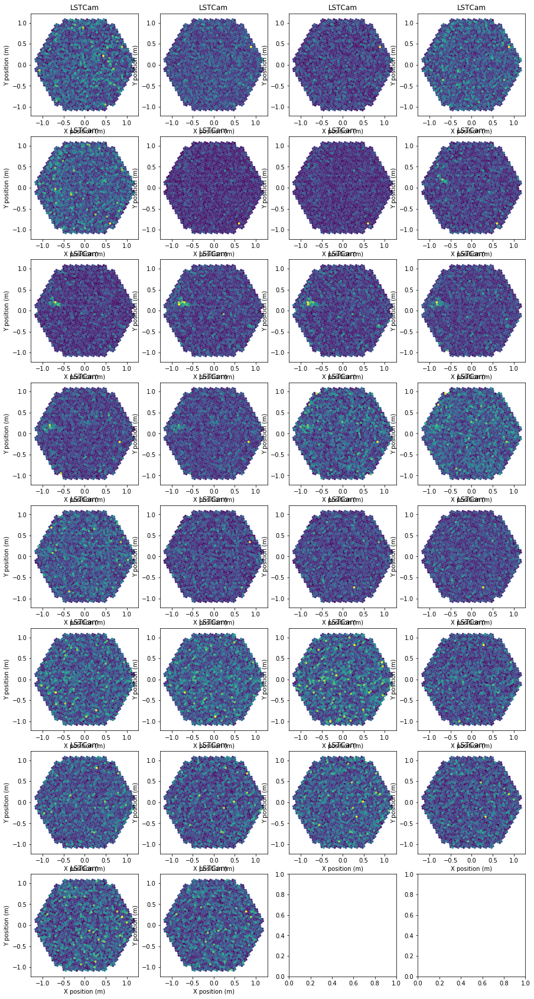

In [347]:
fig, axes = plt.subplots(8, 4, figsize=(15,30))
for ii, image in enumerate(calibrated_samples.T):
    ax = axes.ravel()[ii]
    CameraDisplay(camera, image, ax=ax)

In [353]:
for image in calibrated_samples.T:
    print(image.max())

1.3337597
2.0153127
2.1616483
1.5519166
1.4106048
3.1375973
3.1247573
2.264471
2.6893733
2.4184258
2.324824
2.5229824
2.2820952
2.3179283
1.4758518
1.4306339
1.5115755
1.9590347
2.0818415
2.1374114
1.3347354
1.2783681
1.1119674
1.610434
1.5513867
1.4861673
1.33987
1.6000473
1.2653574
1.4080977


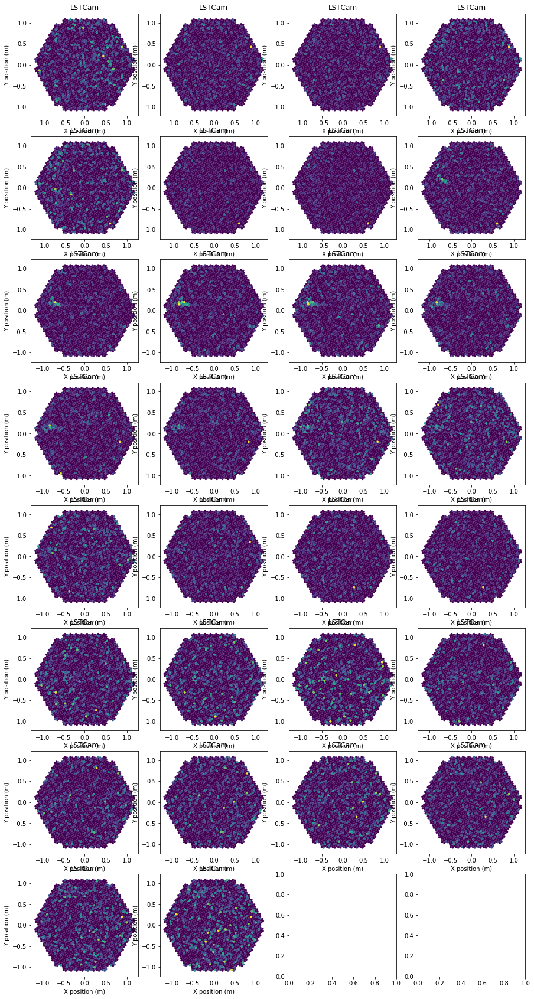

In [512]:
fig, axes = plt.subplots(8, 4, figsize=(15,30))
for ii, image in enumerate(calibrated_samples.T):
    ax = axes.ravel()[ii]
    cleanmask = tailcuts_clean(camera, image,
                                           picture_thresh=0,
                                           boundary_thresh=0,
                                           keep_isolated_pixels=False,
                                           min_number_picture_neighbors=1,
                                           )
    clean = copy.deepcopy(image)
    clean[~cleanmask] = 0
    CameraDisplay(camera, clean, ax=ax)

In [484]:
from sklearn.cluster import KMeans, DBSCAN

In [497]:
kmean = KMeans(n_clusters=2)
dbscan = DBSCAN()

In [469]:
pixpos = np.array([camera.pix_x.value, camera.pix_y.value])

In [451]:
image_array = np.empty((1855,3))
image_array[:,0] = calibrated_image
image_array[:,1] = camera.pix_x.value
image_array[:,2] = camera.pix_y.value

In [452]:
clusters = kmean.fit_predict(image_array)

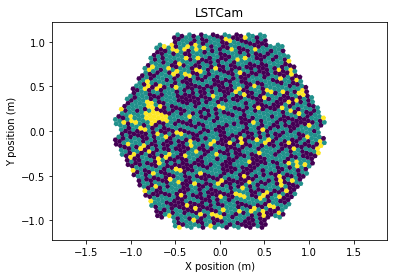

In [453]:
CameraDisplay(camera, clusters)

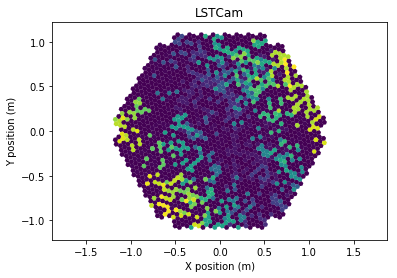

In [523]:
dbscan = DBSCAN(eps=0.2)
clusters = dbscan.fit_predict(image_array)
CameraDisplay(camera, clusters)

In [458]:
time_array = np.empty((1855,3))
time_array[:,0] = peakpos
time_array[:,1] = camera.pix_x.value
time_array[:,2] = camera.pix_y.value

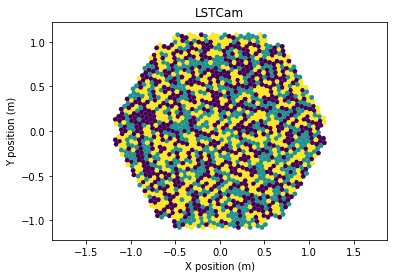

In [460]:
clusters = kmean.fit_predict(time_array)
CameraDisplay(camera, clusters)

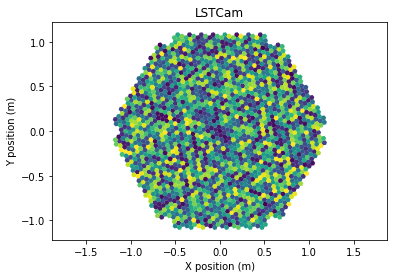

In [488]:
clusters = dbscan.fit_predict(time_array)
CameraDisplay(camera, clusters)

In [454]:
big_array = np.empty((1855, 4))

In [455]:
big_array[:,0] = calibrated_image
big_array[:,1] = camera.pix_x.value
big_array[:,2] = camera.pix_y.value
big_array[:,3] = peakpos

In [482]:
kmean = KMeans(n_clusters=2, )
clusters = kmean.fit_predict(big_array)

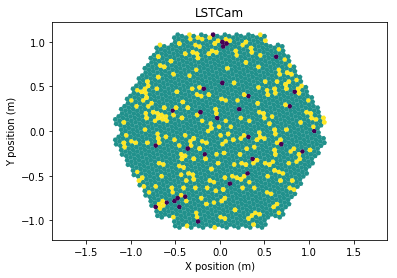

In [483]:
CameraDisplay(camera, clusters)

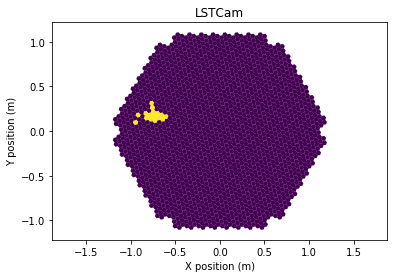

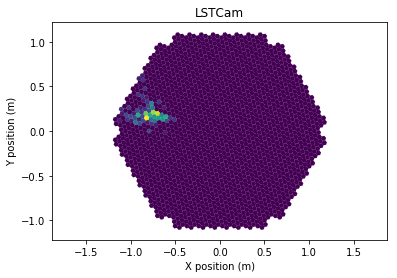

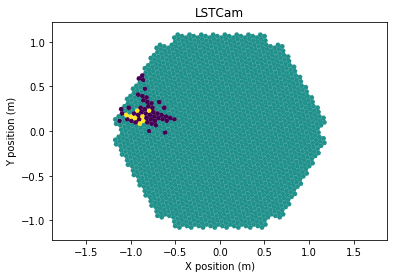

In [511]:
true_array = np.empty((1855, 3))
true_array[:,0] = event.mc.tel[tel_id].photo_electron_image
true_array[:,1] = pixpos[0]
true_array[:,2] = pixpos[1]

kmean = KMeans(n_clusters=2)
clusters = kmean.fit_predict(true_array)
CameraDisplay(camera, clusters)
plt.show()
CameraDisplay(camera, event.mc.tel[tel_id].photo_electron_image)
plt.show()
dbscan = DBSCAN(eps=0.1)
clusters = dbscan.fit_predict(true_array)
CameraDisplay(camera, clusters)
plt.show()

In [72]:
def make_square_samples(camera, samples):
    square_samples = []
    for image in samples:
        square_geom, square = convert_geometry_hex1d_to_rect2d(camera, image)
        square_samples.append(square)
    return square_geom, square_samples

In [84]:
square_geom, square_calibrated_samples = make_square_samples(camera, calibrated_samples.T)

In [85]:
square_calibrated_samples = np.nan_to_num(square_calibrated_samples)

In [86]:
from scipy import ndimage

In [87]:
thresh = 0.1
binary_samples = np.zeros_like(square_calibrated_samples)
binary_samples[square_calibrated_samples>thresh] = 1

In [88]:
binary_samples.shape

(30, 55, 55)

In [89]:
mask = ndimage.binary_opening(binary_samples, 
                              iterations=1, 
                              structure=np.ones((2,2,2), dtype=bool))

In [97]:
from astropy.coordinates.angles import Angle


In [104]:
key = 1
convert_geometry_hex1d_to_rect2d(camera, calibrated_image, key)

(CameraGeometry(cam_id='LSTCam_rect', pix_type='rectangular', npix=0, cam_rot=0.0 deg, pix_rot=0.0 deg),
 array([[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]))

In [108]:
clean = copy.deepcopy(square_calibrated_samples[0])
clean[~mask[0]] = 0
hex_geom, hex_image = convert_geometry_rect2d_back_to_hexe1d(square_geom, 
                                       clean, 
                                       key=key)

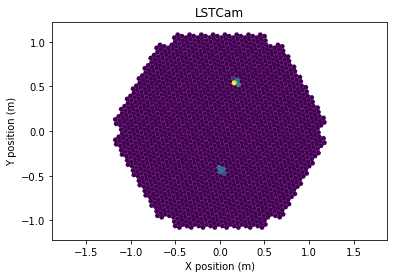

In [109]:
CameraDisplay(hex_geom, hex_image)

In [111]:
clean_calibrated_samples = np.zeros_like(calibrated_samples)

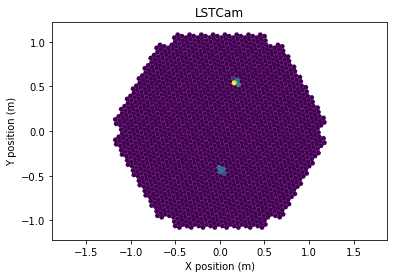

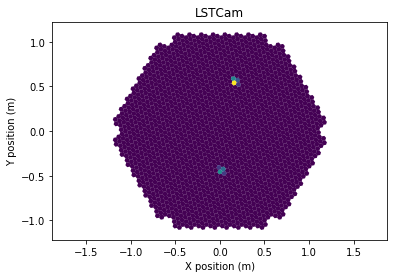

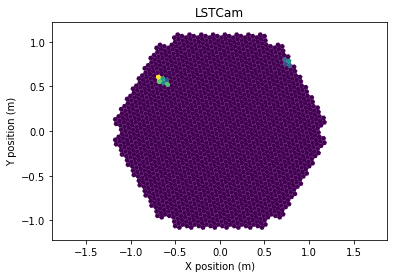

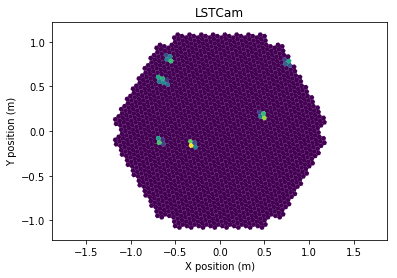

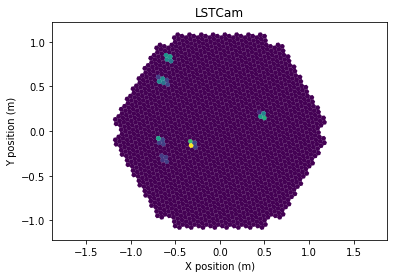

...

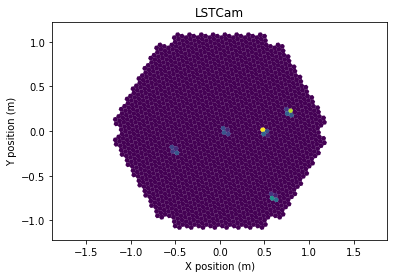

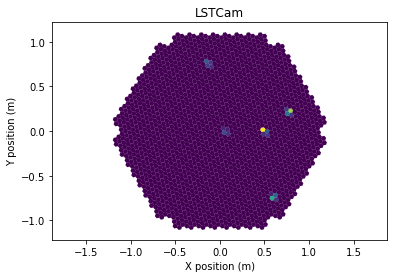

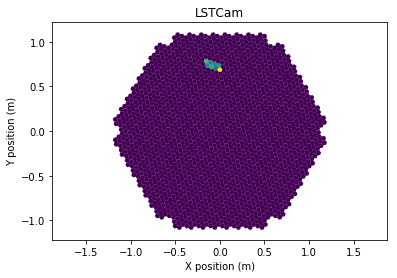

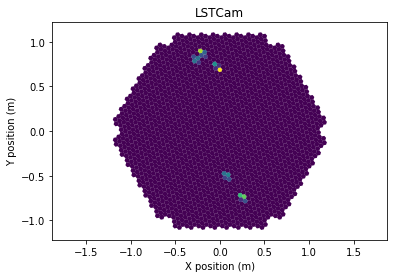

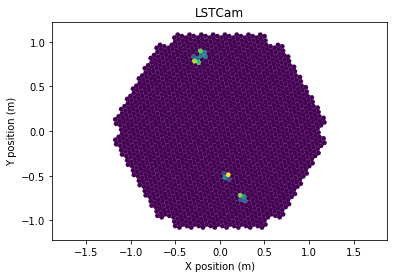

In [112]:
for i, m in enumerate(mask):
    clean = copy.deepcopy(square_calibrated_samples[i])
    clean[~m] = 0
    hex_geom, hex_image = convert_geometry_rect2d_back_to_hexe1d(square_geom, 
                                       clean, 
                                       key=key)
    clean_calibrated_samples.T[i] = hex_image
    CameraDisplay(hex_geom, hex_image)
    plt.show()

In [113]:
clean_calibrated_image = clean_calibrated_samples.sum(axis=1)

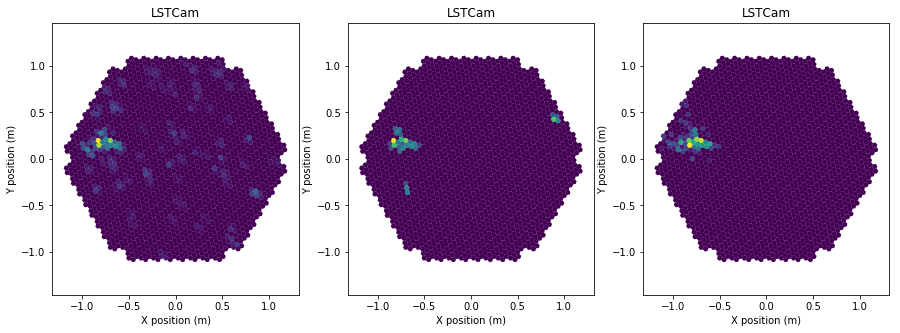

In [124]:
fig, axes = plt.subplots(1, 3, figsize=(15,5))
CameraDisplay(camera, clean_calibrated_image, ax=axes[0])
CameraDisplay(camera, cleaned, ax=axes[1])
CameraDisplay(camera, event.mc.tel[tel_id].photo_electron_image, ax=axes[2])

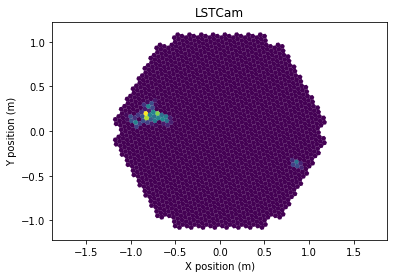

In [132]:
cleanmask = tailcuts_clean(camera, clean_calibrated_image,
                                           picture_thresh=3,
                                           boundary_thresh=0,
                                           keep_isolated_pixels=False,
                                           min_number_picture_neighbors=1,
                                           )
recleaned = copy.copy(clean_calibrated_image)
recleaned[~cleanmask] = 0
CameraDisplay(camera, recleaned)

In [133]:
np.linalg.norm((recleaned - event.mc.tel[tel_id].photo_electron_image))

16.618261062716716

In [128]:
np.linalg.norm((cleaned - event.mc.tel[tel_id].photo_electron_image))

25.325706398782273

In [ ]:
def time_cleaning_v1(event):
    # First calibrate each sample
    
    # Then make a square calibrated sample
    
    # Apply filter: thresh + opening
    
    # Come back to hex
    
    # Tailcut clean

In [ ]:
def tailcuts_time_clean(geom, image, peakpos, picture_thresh=7, boundary_thresh=5,
                   keep_isolated_pixels=False,
                   min_number_picture_neighbors=0):

    """Clean an image by selection pixels that pass a two-threshold
    tail-cuts procedure.  The picture and boundary thresholds are
    defined with respect to the pedestal dispersion. All pixels that
    have a signal higher than the picture threshold will be retained,
    along with all those above the boundary threshold that are
    neighbors of a picture pixel.

    To include extra neighbor rows of pixels beyond what are accepted, use the
    `ctapipe.image.dilate` function.

    Parameters
    ----------
    geom: `ctapipe.instrument.CameraGeometry`
        Camera geometry information
    image: array
        pixel values
    picture_thresh: float or array
        threshold above which all pixels are retained
    boundary_thresh: float or array
        threshold above which pixels are retained if they have a neighbor
        already above the picture_thresh
    keep_isolated_pixels: bool
        If True, pixels above the picture threshold will be included always,
        if not they are only included if a neighbor is in the picture or
        boundary
    min_number_picture_neighbors: int
        A picture pixel survives cleaning only if it has at least this number
        of picture neighbors. This has no effect in case keep_isolated_pixels is True

    Returns
    -------

    A boolean mask of *clean* pixels.  To get a zero-suppressed image and pixel
    list, use `image[mask], geom.pix_id[mask]`, or to keep the same
    image size and just set unclean pixels to 0 or similar, use
    `image[~mask] = 0`

    """
    pixels_above_picture = image >= picture_thresh

    if keep_isolated_pixels or min_number_picture_neighbors == 0:
        pixels_in_picture = pixels_above_picture
    else:
        # Require at least min_number_picture_neighbors. Otherwise, the pixel
        #  is not selected
        number_of_neighbors_above_picture = geom.neighbor_matrix_sparse.dot(
            pixels_above_picture.view(np.byte))
        pixels_in_picture = pixels_above_picture & (
            number_of_neighbors_above_picture >= min_number_picture_neighbors
        )

    # by broadcasting together pixels_in_picture (1d) with the neighbor
    # matrix (2d), we find all pixels that are above the boundary threshold
    # AND have any neighbor that is in the picture
    pixels_above_boundary = image >= boundary_thresh
    pixels_with_picture_neighbors = geom.neighbor_matrix_sparse.dot(
        pixels_in_picture)
    if keep_isolated_pixels:
        return (pixels_above_boundary
                & pixels_with_picture_neighbors) | pixels_in_picture
    else:
        pixels_with_boundary_neighbors = geom.neighbor_matrix_sparse.dot(
            pixels_above_boundary)
        return ((pixels_above_boundary & pixels_with_picture_neighbors) |
                (pixels_in_picture & pixels_with_boundary_neighbors))

